# EDA of SPX Data

### Plan for EDA
Each section will compare overall vs put vs call
1. Describing the data
2. Correlation Analyses
3. Time Series Data
4. Greeks

The target variable to be predicted is `close`

Data used is option quotes from the last trading friday of 3 months (Jul 2024, Aug 2024, Sep 2024)
<br><br>
<i>Source: Chicago Board Options Exchange</i>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Describing the data

In [3]:
df1 = pd.read_csv('../data/SPX/UnderlyingOptionsIntervals_3600sec_calcs_oi_2024-07-26.csv')
df2 = pd.read_csv('../data/SPX/UnderlyingOptionsIntervals_3600sec_calcs_oi_2024-08-30.csv')
df3 = pd.read_csv('../data/SPX/UnderlyingOptionsIntervals_3600sec_calcs_oi_2024-09-27.csv')

In [4]:
# Concatenating data to form a combined dataframe for put options
df_call = pd.concat([
    df1[(df1['option_type'] == 'C') & (df1['root'] == 'SPX')],
    df2[(df2['option_type'] == 'C') & (df2['root'] == 'SPX')],
    df3[(df3['option_type'] == 'C') & (df3['root'] == 'SPX')]
], ignore_index=True)

print("Null Values:")
print(df_call.isnull().sum())

Null Values:
underlying_symbol           0
quote_datetime              0
root                        0
expiration                  0
strike                      0
option_type                 0
open                        0
high                        0
low                         0
close                       0
trade_volume                0
bid_size                    0
bid                         0
ask_size                    0
ask                         0
underlying_bid              0
underlying_ask              0
implied_underlying_price    0
active_underlying_price     0
implied_volatility          0
delta                       0
gamma                       0
theta                       0
vega                        0
rho                         0
open_interest               0
dtype: int64


In [5]:

df_put = pd.concat([
    df1[(df1['option_type'] == 'P') & (df1['root'] == 'SPX')],
    df2[(df2['option_type'] == 'P') & (df2['root'] == 'SPX')],
    df3[(df3['option_type'] == 'P') & (df3['root'] == 'SPX')]
], ignore_index=True)

print("Null Values:")
print(df_put.isnull().sum())

Null Values:
underlying_symbol           0
quote_datetime              0
root                        0
expiration                  0
strike                      0
option_type                 0
open                        0
high                        0
low                         0
close                       0
trade_volume                0
bid_size                    0
bid                         0
ask_size                    0
ask                         0
underlying_bid              0
underlying_ask              0
implied_underlying_price    0
active_underlying_price     0
implied_volatility          0
delta                       0
gamma                       0
theta                       0
vega                        0
rho                         0
open_interest               0
dtype: int64


,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,...,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,open_interest
0,^SPX,2024-07-26 10:30:00,SPX,2024-08-16,200.0,P,0.0,0.0,0.0,0.0,...,5456.22,0.0,5454.130,3.7939,-0.0,0.0,-0.0085,0.0011,-0.0001,368
1,^SPX,2024-07-26 11:30:00,SPX,2024-08-16,200.0,P,0.0,0.0,0.0,0.0,...,5450.09,0.0,5448.565,3.7963,-0.0,0.0,-0.0085,0.0011,-0.0001,368
2,^SPX,2024-07-26 12:30:00,SPX,2024-08-16,200.0,P,0.0,0.0,0.0,0.0,...,5474.09,0.0,5472.665,3.8050,-0.0,0.0,-0.0085,0.0011,-0.0001,368
3,^SPX,2024-07-26 13:30:00,SPX,2024-08-16,200.0,P,0.0,0.0,0.0,0.0,...,5488.51,0.0,5487.260,3.8112,-0.0,0.0,-0.0085,0.0011,-0.0001,368
4,^SPX,2024-07-26 14:30:00,SPX,2024-08-16,200.0,P,0.0,0.0,0.0,0.0,...,5463.44,0.0,5462.100,3.8107,-0.0,0.0,-0.0086,0.0011,-0.0001,368


### Descriptive Statistics of call dataframe

In [94]:
df_call.describe(include='all')

underlying_symbol       quote_datetime   root  expiration  \
count              82943                82943  82943       82943   
unique                 1                   21      1          22   
top                 ^SPX  2024-09-27 16:15:00    SPX  2024-10-18   
freq               82943                 3976  82943        8449   
mean                 NaN                  NaN    NaN         NaN   
std                  NaN                  NaN    NaN         NaN   
min                  NaN                  NaN    NaN         NaN   
25%                  NaN                  NaN    NaN         NaN   
50%                  NaN                  NaN    NaN         NaN   
75%                  NaN                  NaN    NaN         NaN   
max                  NaN                  NaN    NaN         NaN   

              strike option_type          open          high           low  \
count   82943.000000       82943  82943.000000  82943.000000  82943.000000   
unique           NaN           1           NaN           NaN           NaN   
top              NaN           C           NaN           NaN           NaN   
freq             NaN       82943           NaN           NaN           NaN   
mean     4936.404760         NaN     11.687635     11.726253     11.665080   
std      1600.216622         NaN    103.149493    103.229739    103.095422   
min       200.000000         NaN      0.000000      0.000000      0.000000   
25%      4100.000000         NaN      0.000000      0.000000      0.000000   
50%      5080.000000         NaN      0.000000      0.000000      0.000000   
75%      5765.000000         NaN      0.000000      0.000000      0.000000   
max     12000.000000         NaN   5371.490000   5371.490000   5371.490000   

               close  ...  underlying_ask  implied_underlying_price  \
count   82943.000000  ...    82943.000000                   82943.0   
unique           NaN  ...             NaN                       NaN   
top              NaN  ...             NaN                       NaN   
freq             NaN  ...             NaN                       NaN   
mean       11.702774  ...     5616.504666                       0.0   
std       103.171225  ...      115.350138                       0.0   
min         0.000000  ...     5450.090000                       0.0   
25%         0.000000  ...     5488.510000                       0.0   
50%         0.000000  ...     5607.470000                       0.0   
75%         0.000000  ...     5740.610000                       0.0   
max      5371.490000  ...     5774.820000                       0.0   

        active_underlying_price  implied_volatility         delta  \
count              82943.000000        82943.000000  82943.000000   
unique                      NaN                 NaN           NaN   
top                         NaN                 NaN           NaN   
freq                        NaN                 NaN           NaN   
mean                5607.339904            0.272359      0.690461   
std                  114.456297            0.263138      0.332503   
min                 5448.565000            0.000000      0.000000   
25%                 5472.665000            0.148000      0.485100   
50%                 5606.305000            0.204100      0.835800   
75%                 5733.735000            0.293600      0.964000   
max                 5760.520000            6.644800      1.000000   

               gamma         theta          vega           rho  open_interest  
count   82943.000000  82943.000000  82943.000000  82943.000000   82943.000000  
unique           NaN           NaN           NaN           NaN            NaN  
top              NaN           NaN           NaN           NaN            NaN  
freq             NaN           NaN           NaN           NaN            NaN  
mean        0.000322     -0.296503      8.669474     19.336421    1389.975019  
std         0.000388      0.327589      8.741568     23.115742    7063.538995  
min        

In [95]:
df_put.describe(include='all')

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,...,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,open_interest
count,82943,82943,82943,82943,82943.000000,82943,82943.000000,82943.000000,82943.000000,82943.000000,...,82943.000000,82943.0,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000
unique,1,21,1,22,NaN,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,^SPX,2024-09-27 16:15:00,SPX,2024-10-18,NaN,P,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,82943,3976,82943,8449,NaN,82943,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,4936.404760,NaN,8.187410,8.216931,8.142458,8.172377,...,5616.504666,0.0,5607.339904,0.264496,-0.303190,0.000324,-0.367890,8.781694,-17.378411,2429.353026
std,NaN,NaN,NaN,NaN,1600.216622,NaN,46.211408,46.283158,46.110520,46.180568,...,115.350138,0.0,114.456297,0.203704,0.325361,0.000386,0.310356,8.746967,36.553025,8520.031053
min,NaN,NaN,NaN,NaN,200.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5450.090000,0.0,5448.565000,0.000000,-1.000000,0.000000,-1.880600,0.000000,-437.769300,0.000000
25%,NaN,NaN,NaN,NaN,4100.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5488.510000,0.0,5472.665000,0.152000,-0.497800,0.000100,-0.526550,1.784600,-16.610000,8.000000
50%,NaN,NaN,NaN,NaN,5080.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5607.470000,0.0,5606.305000,0.208100,-0.161500,0.000200,-0.309900,6.318900,-4.562600,255.000000
75%,NaN,NaN,NaN,NaN,5765.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5740.610000,0.0,5733.735000,0.296600,-0.037900,0.000500,-0.135300,13.027050,-0.826550,1657.000000


In [96]:
df_call.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82943 entries, 0 to 82942
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   underlying_symbol         82943 non-null  object 
 1   quote_datetime            82943 non-null  object 
 2   root                      82943 non-null  object 
 3   expiration                82943 non-null  object 
 4   strike                    82943 non-null  float64
 5   option_type               82943 non-null  object 
 6   open                      82943 non-null  float64
 7   high                      82943 non-null  float64
 8   low                       82943 non-null  float64
 9   close                     82943 non-null  float64
 10  trade_volume              82943 non-null  int64  
 11  bid_size                  82943 non-null  int64  
 12  bid                       82943 non-null  float64
 13  ask_size                  82943 non-null  int64  
 14  ask   

In [97]:
df_put.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82943 entries, 0 to 82942
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   underlying_symbol         82943 non-null  object 
 1   quote_datetime            82943 non-null  object 
 2   root                      82943 non-null  object 
 3   expiration                82943 non-null  object 
 4   strike                    82943 non-null  float64
 5   option_type               82943 non-null  object 
 6   open                      82943 non-null  float64
 7   high                      82943 non-null  float64
 8   low                       82943 non-null  float64
 9   close                     82943 non-null  float64
 10  trade_volume              82943 non-null  int64  
 11  bid_size                  82943 non-null  int64  
 12  bid                       82943 non-null  float64
 13  ask_size                  82943 non-null  int64  
 14  ask   

### Dropping unnecessary columns
`root`,`underlying_symbol`

In [98]:
df_call = df_call.drop(['root','underlying_symbol','implied_underlying_price'],axis=1)
df_put = df_put.drop(['root','underlying_symbol','implied_underlying_price'],axis=1)

### Converting relevant columns to datetime
`expiration` and `quotedate`

In [99]:
df_call['expiration'] = pd.to_datetime(df_call['expiration'])
df_call['quote_datetime'] = pd.to_datetime(df_call['quote_datetime'])

df_put['expiration'] = pd.to_datetime(df_put['expiration'])
df_put['quote_datetime'] = pd.to_datetime(df_put['quote_datetime'])


## Histograms of key features

### `Strike Price Distribution` <br>
Strike price is the price at which the option can be exercised. <br>

### Observations
* A wide distribution indicates a wide range of strike prices available to traders
* A negative concentration of strike prices indicates the market believes the asset price is likely to decrease

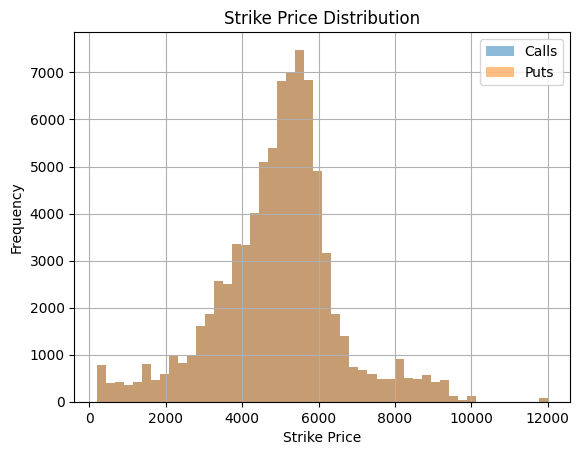

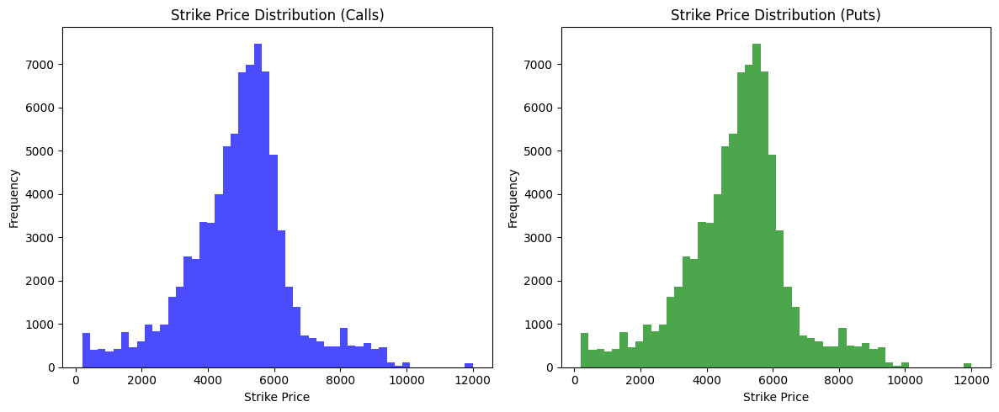

In [100]:
df_call['strike'].hist(bins=50, alpha=0.5, label='Calls')
df_put['strike'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Strike Price Distribution')
plt.xlabel('Strike Price')
plt.ylabel('Frequency')
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(12, 5)) 

ax[0].hist(df_call['strike'], bins=50, alpha=0.7, color='blue', label='Calls')
ax[0].set_title('Strike Price Distribution (Calls)')
ax[0].set_xlabel('Strike Price')
ax[0].set_ylabel('Frequency')

ax[1].hist(df_put['strike'], bins=50, alpha=0.7, color='green', label='Puts')
ax[1].set_title('Strike Price Distribution (Puts)')
ax[1].set_xlabel('Strike Price')
ax[1].set_ylabel('Frequency')

plt.tight_layout() 
plt.show()


### `Implied Volatility Distribution` <br>
Implied volatility reflects the market's expectation of future price volatility. <br>

### Observations
* Calls have a stronger positive skew, indicating some variation in perception of volatility of SPX calls, with significant outliers as some traders expect large upward movement of price and others expect more moderate movements
* Puts have a more concentrated IV distribution, this indicates higher uncertainty towards downwards price fluctuations

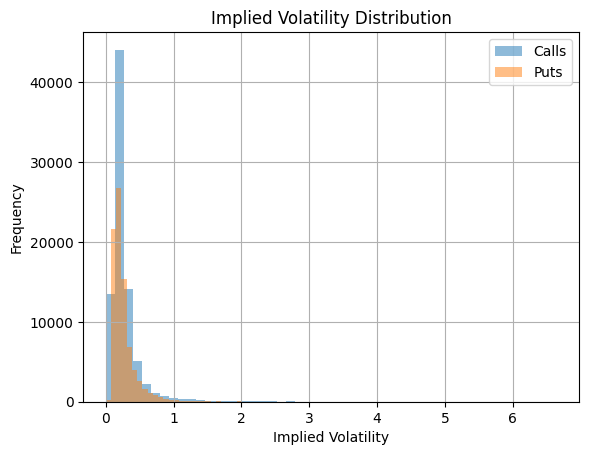

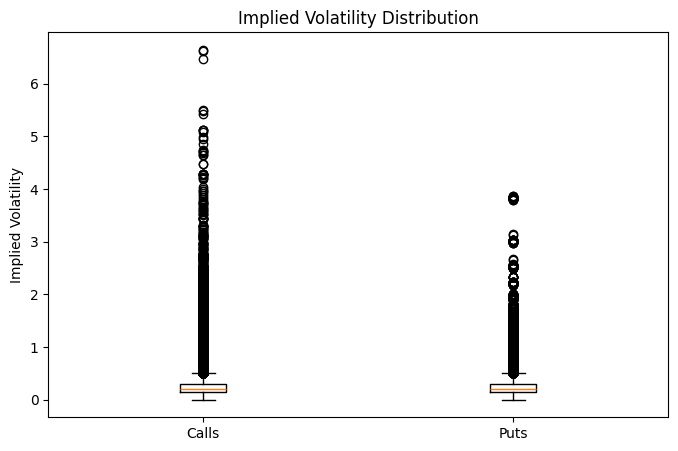

In [147]:
df_call['implied_volatility'].hist(bins=50, alpha=0.5, label='Calls')
df_put['implied_volatility'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Implied Volatility Distribution')
plt.xlabel('Implied Volatility')
plt.ylabel('Frequency')
plt.show()


data = [df_call['implied_volatility'], df_put['implied_volatility']]

plt.figure(figsize=(8, 5))
plt.boxplot(data, tick_labels=['Calls', 'Puts'])

plt.title('Implied Volatility Distribution')
plt.ylabel('Implied Volatility')

plt.show()

### `Option Price Distribution` <br>
Option price is the range of prices at which the options are traded. <br>

### Observations
* Calls have a stronger positive skew, indicating traders are buying more low-priced call options, likely out of the money, and positioning for a positive upwards movement

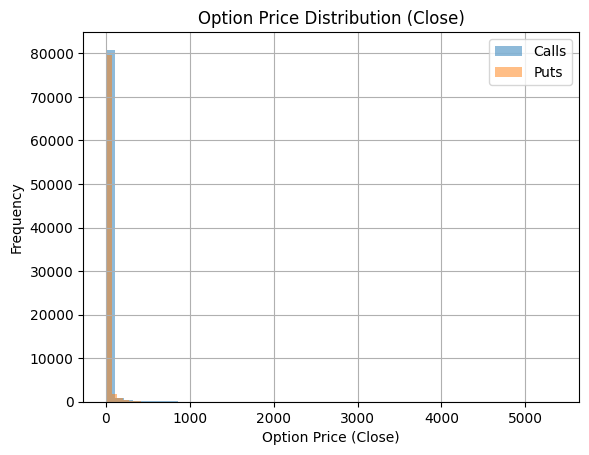

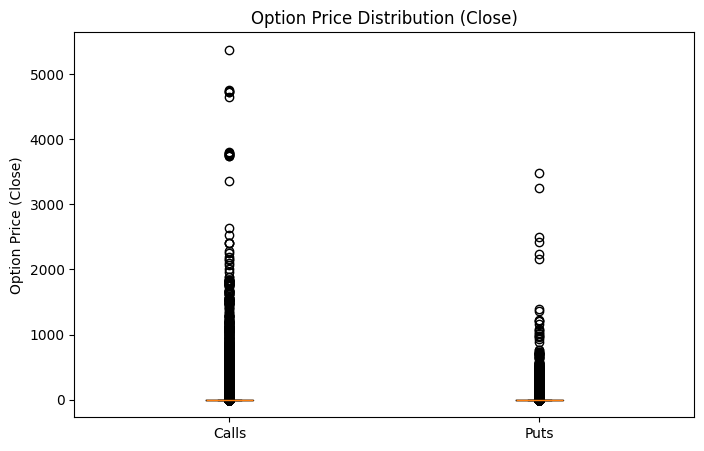

In [102]:
df_call['close'].hist(bins=50, alpha=0.5, label='Calls')
df_put['close'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Option Price Distribution (Close)')
plt.xlabel('Option Price (Close)')
plt.ylabel('Frequency')
plt.show()

data = [df_call['close'], df_put['close']]

plt.figure(figsize=(8, 5))
plt.boxplot(data, tick_labels=['Calls', 'Puts'])

plt.title('Option Price Distribution (Close)')
plt.ylabel('Option Price (Close)')

plt.show()


### `Trade Volume Distribution` <br>
The amount of trading activity for different options, showing how many contracts are being traded. <br>

### Observations
* Calls have a weaker skew, indicating market sentiment is overall more stable, less speculative, less extreme bets

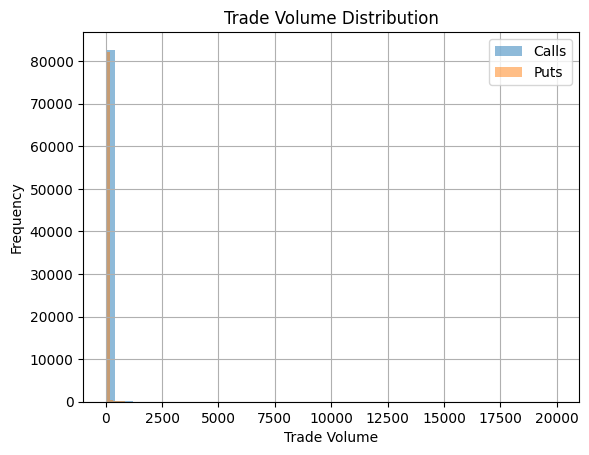

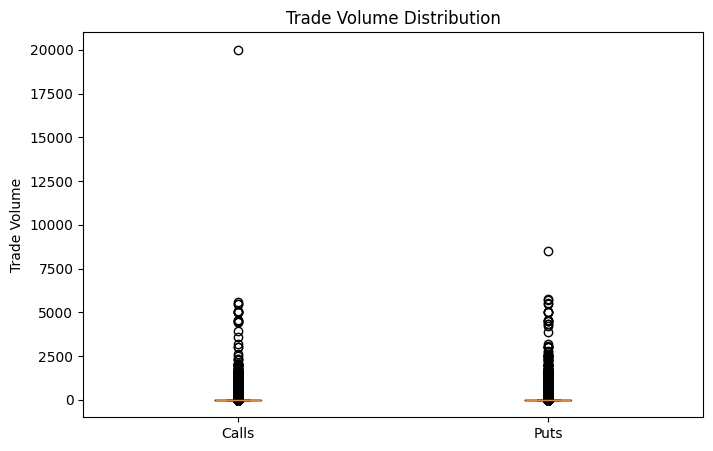

In [136]:
df_call['trade_volume'].hist(bins=50, alpha=0.5, label='Calls')
df_put['trade_volume'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Trade Volume Distribution')
plt.xlabel('Trade Volume')
plt.ylabel('Frequency')
plt.show()

data = [df_call['trade_volume'],df_put['trade_volume']]

plt.figure(figsize=(8,5))
plt.boxplot(data,tick_labels=['Calls','Puts'])

plt.title('Trade Volume Distribution')
plt.ylabel('Trade Volume')

plt.show()


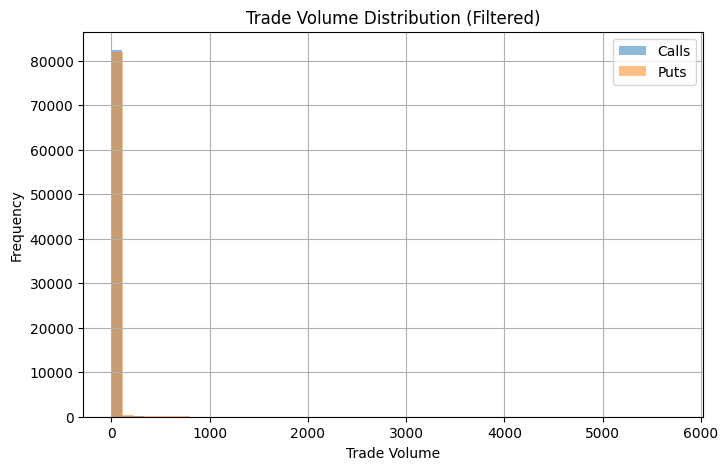

/var/folders/tk/ptln5ljx66g1yqhg_dd36_200000gn/T/ipykernel_73976/1357079509.py:22: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_filtered, labels=['Calls', 'Puts'])


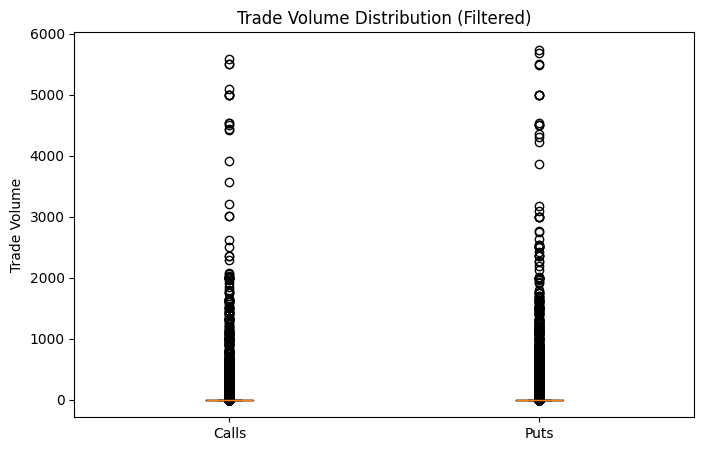

In [148]:
# Further filtering to remove extreme outlier from df_call

# Filter the data to exclude trade volumes greater than 15,000
df_call_filtered = df_call[df_call['trade_volume'] <= 8000]
df_put_filtered = df_put[df_put['trade_volume'] <= 8000]

# Plotting the histogram for Calls and Puts after filtering
plt.figure(figsize=(8,5))
df_call_filtered['trade_volume'].hist(bins=50, alpha=0.5, label='Calls')
df_put_filtered['trade_volume'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Trade Volume Distribution (Filtered)')
plt.xlabel('Trade Volume')
plt.ylabel('Frequency')
plt.show()

# Prepare the filtered data for the boxplot
data_filtered = [df_call_filtered['trade_volume'], df_put_filtered['trade_volume']]

# Plotting the boxplot after filtering
plt.figure(figsize=(8,5))
plt.boxplot(data_filtered, labels=['Calls', 'Puts'])

plt.title('Trade Volume Distribution (Filtered)')
plt.ylabel('Trade Volume')
plt.show()


### `Open Interest Distribution` <br>
The amount of trading activity for different options, showing how many contracts are being traded. <br>

### Observations
* Weaker skew in calls indicates greater participation at higher volumes, indicates confidence in upward price movements

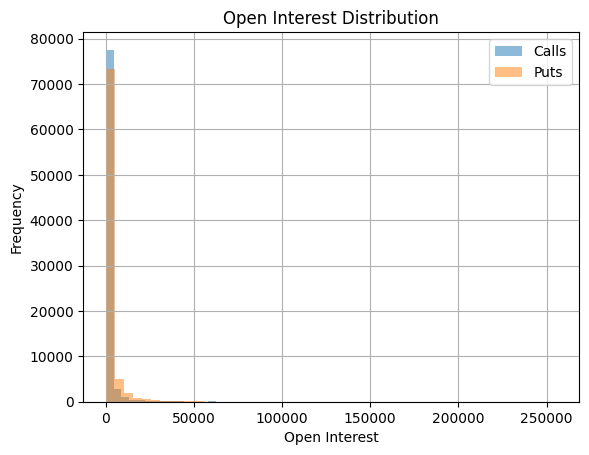

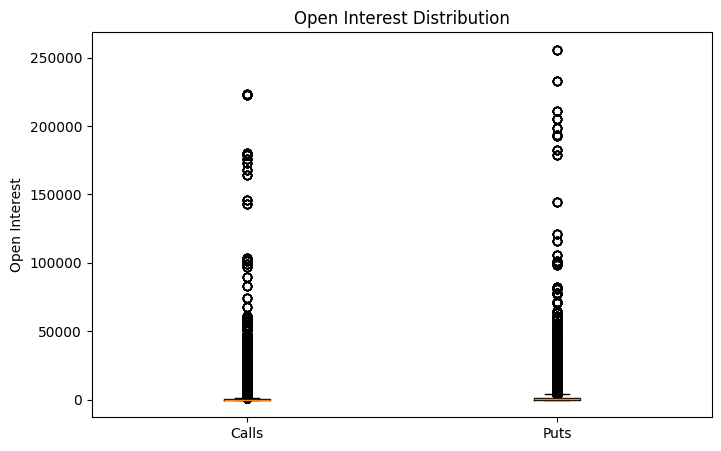

In [104]:
df_call['open_interest'].hist(bins=50, alpha=0.5, label='Calls')
df_put['open_interest'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Open Interest Distribution')
plt.xlabel('Open Interest')
plt.ylabel('Frequency')
plt.show()

data = [df_call['open_interest'],df_put['open_interest']]

plt.figure(figsize=(8,5))
plt.boxplot(data,tick_labels=['Calls','Puts'])

plt.title('Open Interest Distribution')
plt.ylabel('Open Interest')

plt.show()



# 2. Correlation Analyses

### What correlations should be disregarded?
As some variables are derived/implicitly related, some must be disregarded
* `open`, `high`, `low`, `close` represent price points throughout the day and thus likely to be very correlated, thus <i>disregard correlations between these variables</i>
* `bid`, `ask`, `bid_size`, `ask_size` are closely related and form the bid-ask spread, thus disregard correlations <i>between `bid` and `ask`, and between `bid_size` and `ask_size` </i>
* `underlying_bid`, `underlying_ask`, `active_underlying_price` are prices related to the underlying asset and thus are strongly correlated to one another, thus disregard correlations <i>between these 3 variables</i>
* `delta`, `gamma` are closely related as `gamma` represents the change of `delta`, thus <i>disregard correlation between these 2</i>
* `theta`, `vega`, `rho` measure sensitivity to time decay, volatility, and interest rate changes which can be interdependent, thus <i>disregard correlation between these 3</i>
* `implied_volatility` and `close` are strongly related because higher implied volatility increases the price of the option and a strong correlation is expected, thus <i>disregard correlation between these 2</i>

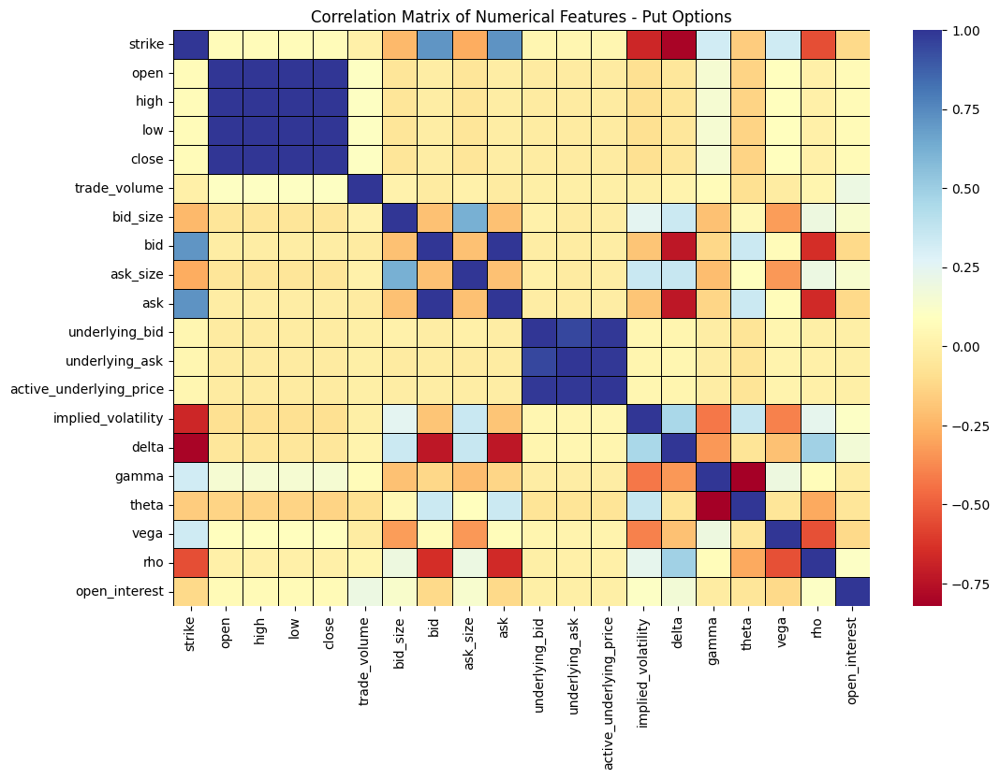

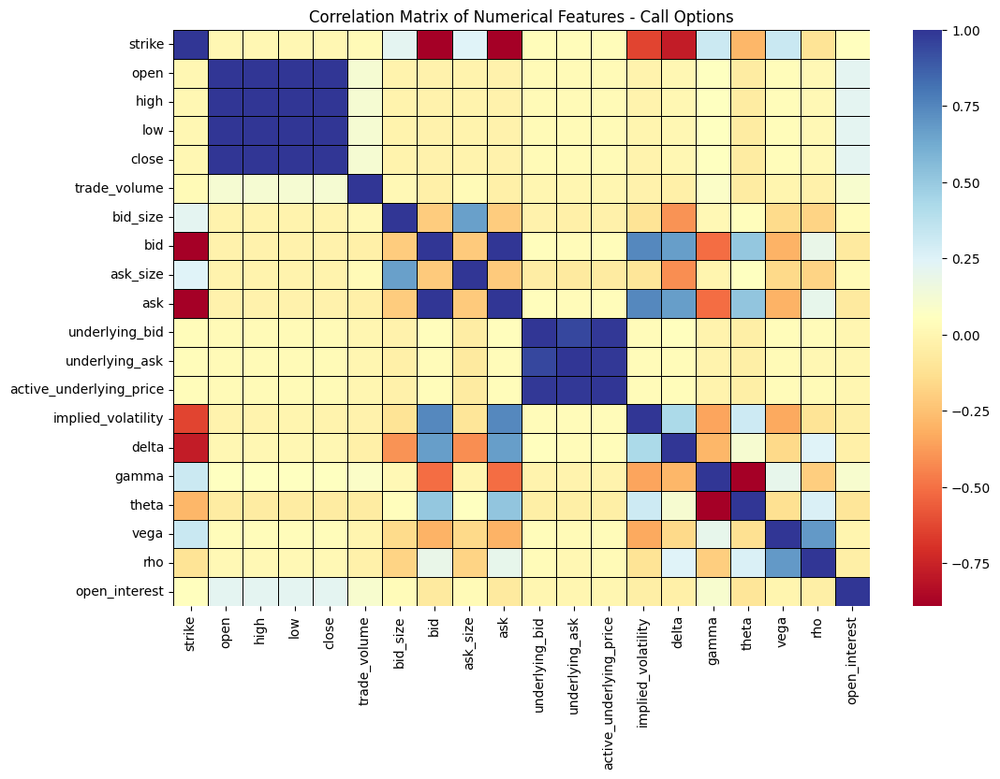

In [134]:
numeric_df_call = df_call.select_dtypes(include=['float64', 'int64'])
numeric_df_put = df_put.select_dtypes(include=['float64', 'int64'])

# Correlation Matrix for Put Options
corr_matrix_put = numeric_df_put.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_put, cmap='RdYlBu', linewidths=0.5, linecolor='black')
plt.title('Correlation Matrix of Numerical Features - Put Options')
plt.show()

# Correlation Matrix for Call Options
corr_matrix_call = numeric_df_call.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_call, cmap='RdYlBu', linewidths=0.5, linecolor='black')
plt.title('Correlation Matrix of Numerical Features - Call Options')
plt.show()


### Pairplots for Puts
For clarity and reducing clutter in pairplots, certain variables will not be shown in the pairplot analyses

Dropped variables:
* `open`, `high`, `low`. These variables represent prices of the asset recorded at different points of the day as the other variables often show similar patterns

In [106]:
numeric_df_put.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82943 entries, 0 to 82942
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   strike                   82943 non-null  float64
 1   open                     82943 non-null  float64
 2   high                     82943 non-null  float64
 3   low                      82943 non-null  float64
 4   close                    82943 non-null  float64
 5   trade_volume             82943 non-null  int64  
 6   bid_size                 82943 non-null  int64  
 7   bid                      82943 non-null  float64
 8   ask_size                 82943 non-null  int64  
 9   ask                      82943 non-null  float64
 10  underlying_bid           82943 non-null  float64
 11  underlying_ask           82943 non-null  float64
 12  active_underlying_price  82943 non-null  float64
 13  implied_volatility       82943 non-null  float64
 14  delta                 

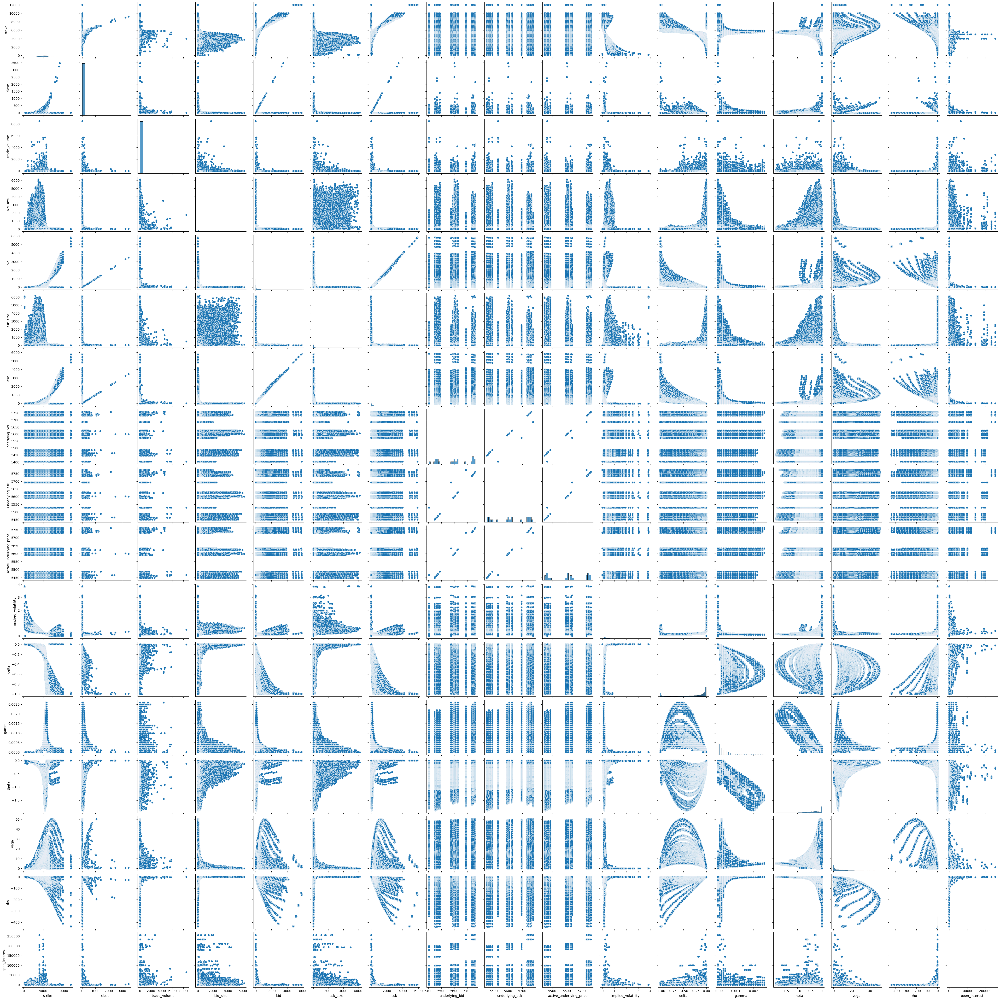

In [107]:
# Selecting a reduced set of variables for pairplot
reduced_numeric_df_put = numeric_df_put[['strike', 'close', 'trade_volume', 'bid_size','bid','ask_size','ask','underlying_bid','underlying_ask','active_underlying_price','implied_volatility', 
                                 'delta', 'gamma', 'theta', 'vega', 'rho', 'open_interest']]

sns.pairplot(reduced_numeric_df_put)
plt.show()

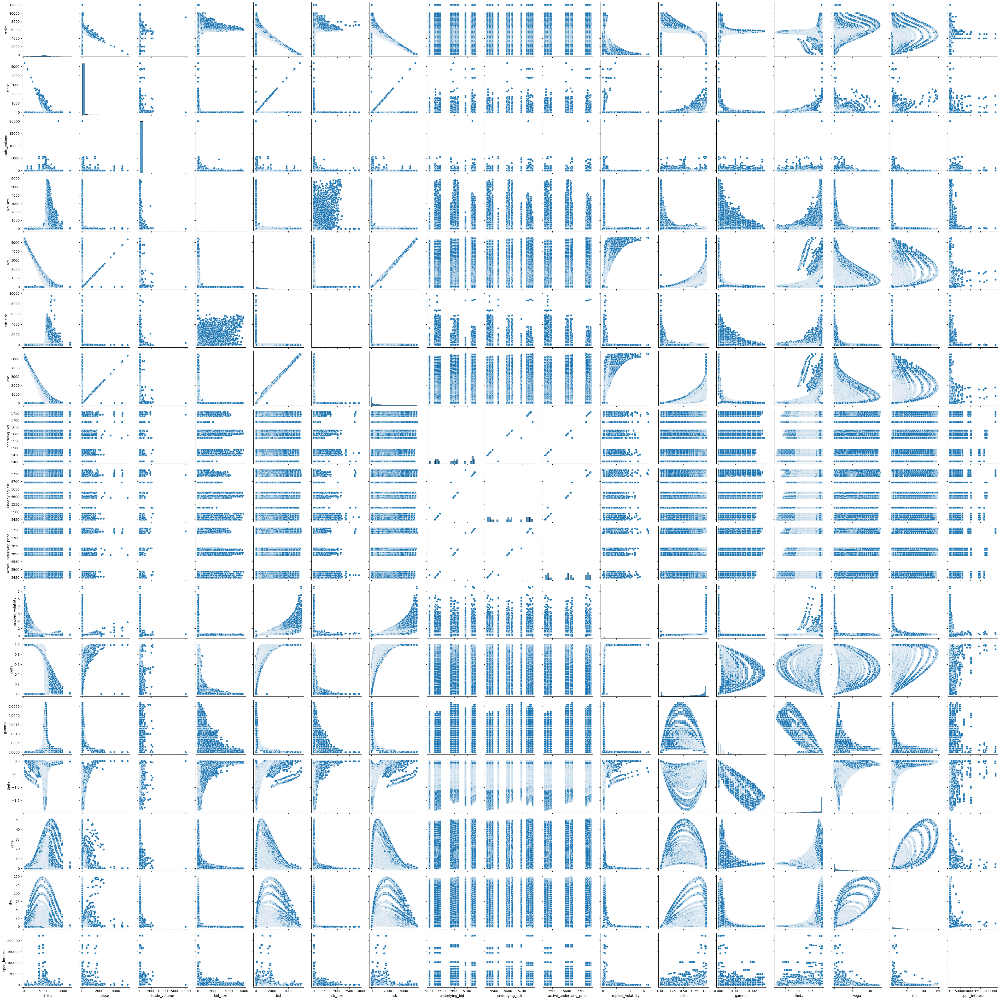

In [123]:
# Selecting a reduced set of variables for pairplot
reduced_numeric_df_call = numeric_df_call[['strike', 'close', 'trade_volume', 'bid_size','bid','ask_size','ask','underlying_bid','underlying_ask','active_underlying_price','implied_volatility', 
                                 'delta', 'gamma', 'theta', 'vega', 'rho', 'open_interest']]

sns.pairplot(reduced_numeric_df_call)
plt.show()

### Correlation Analysis Conclusions

* Minor correlations between greeks and the ask bid spread are observed
* The strike price exhibits relatively strong correlations with the ask bid spread, implied volatility, and the greeks
* Features that are positively correlated for puts may be negatively correlated for calls and vice versa

This analysis highlights the difficulty in predicting options prices

# 3. Time Series Data

In [112]:
# df_put.set_index('quote_datetime', inplace=True)
df_put.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82943 entries, 0 to 82942
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   quote_datetime           82943 non-null  datetime64[ns]
 1   expiration               82943 non-null  datetime64[ns]
 2   strike                   82943 non-null  float64       
 3   option_type              82943 non-null  object        
 4   open                     82943 non-null  float64       
 5   high                     82943 non-null  float64       
 6   low                      82943 non-null  float64       
 7   close                    82943 non-null  float64       
 8   trade_volume             82943 non-null  int64         
 9   bid_size                 82943 non-null  int64         
 10  bid                      82943 non-null  float64       
 11  ask_size                 82943 non-null  int64         
 12  ask                      82943 n

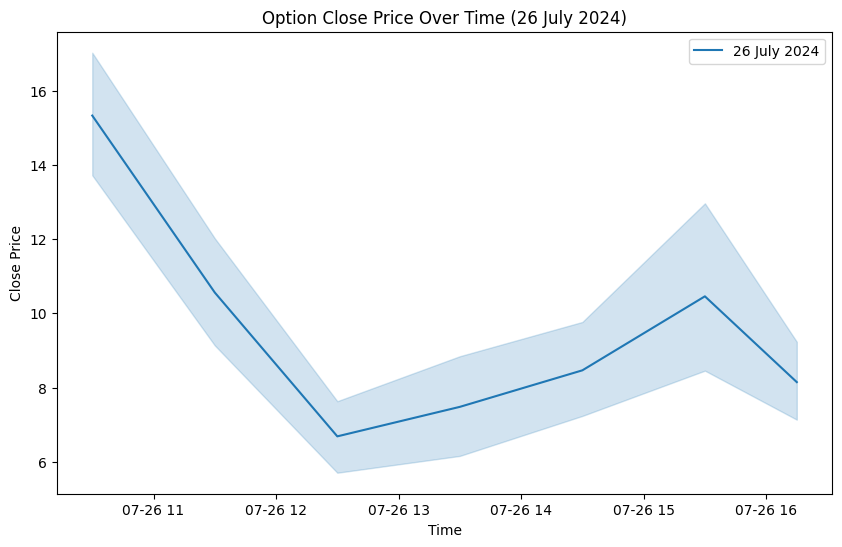

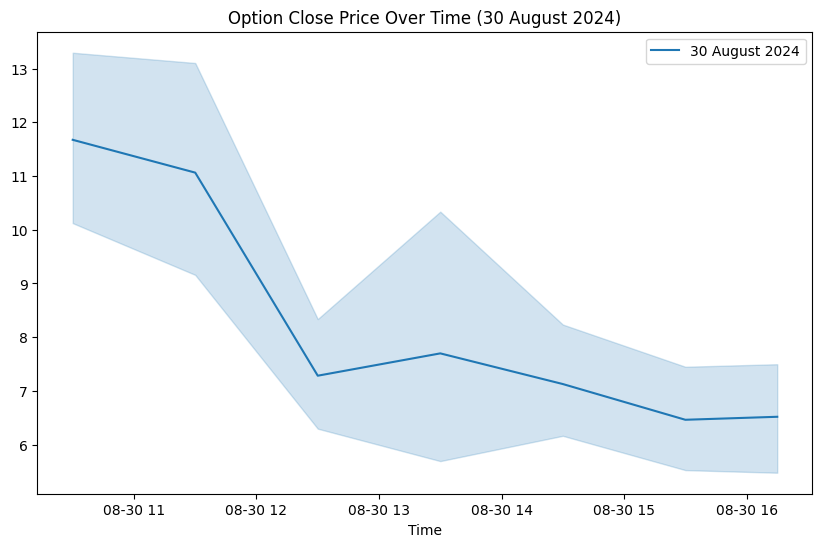

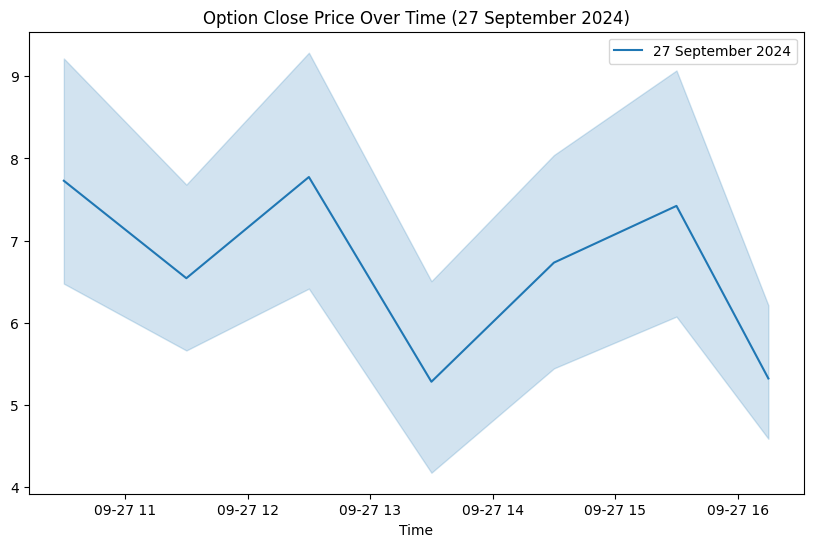

In [141]:
# Filter the data for each specific date
df_put_july = df_put[df_put['quote_datetime'].dt.date == pd.to_datetime('2024-07-26').date()]
df_put_august = df_put[df_put['quote_datetime'].dt.date == pd.to_datetime('2024-08-30').date()]
df_put_september = df_put[df_put['quote_datetime'].dt.date == pd.to_datetime('2024-09-27').date()]

plt.figure(figsize=(10, 6))
sns.lineplot(x=df_put_july['quote_datetime'], y=df_put_july['close'], label='26 July 2024')
plt.title('Option Close Price Over Time (26 July 2024)')
plt.xlabel('Time')
plt.ylabel('Close Price')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.lineplot(x=df_put_august['quote_datetime'], y=df_put_august['close'], label='30 August 2024')
plt.title('Option Close Price Over Time (30 August 2024)')
plt.xlabel('Time')
# plt.ylabel('Close Price')
plt.ylabel('')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.lineplot(x=df_put_september['quote_datetime'], y=df_put_september['close'], label='27 September 2024')
plt.title('Option Close Price Over Time (27 September 2024)')
plt.xlabel('Time')
# plt.ylabel('Close Price')
plt.ylabel('')
plt.legend()
plt.show()


# 4. Greeks

In [9]:
greeks = ['delta', 'gamma', 'theta', 'vega', 'rho']

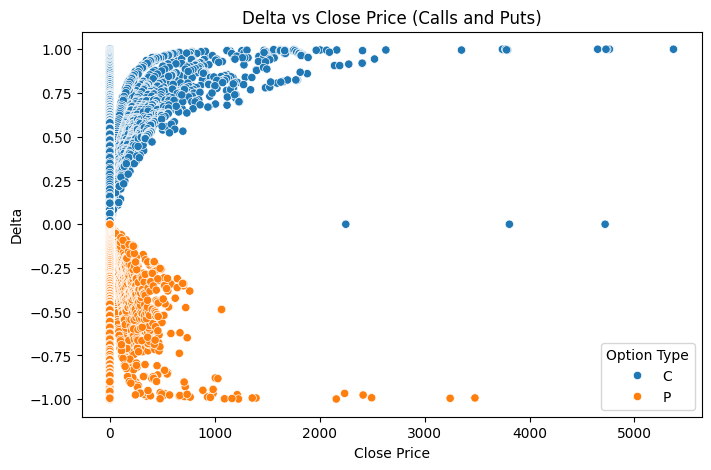

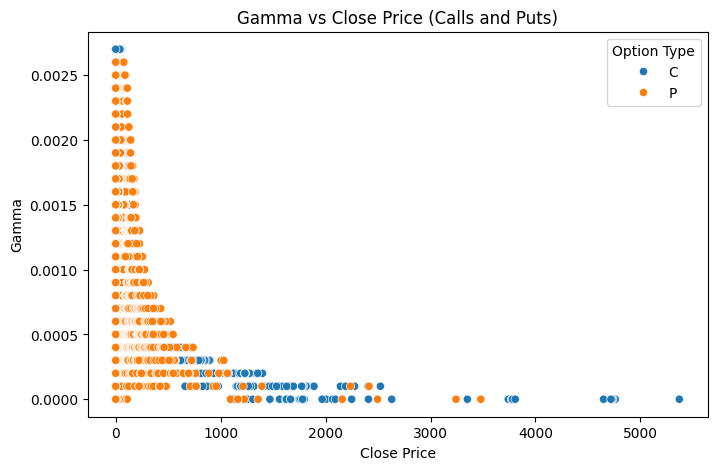

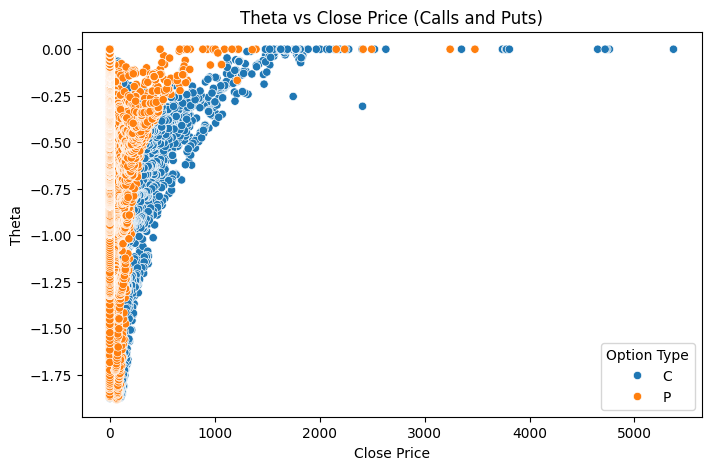

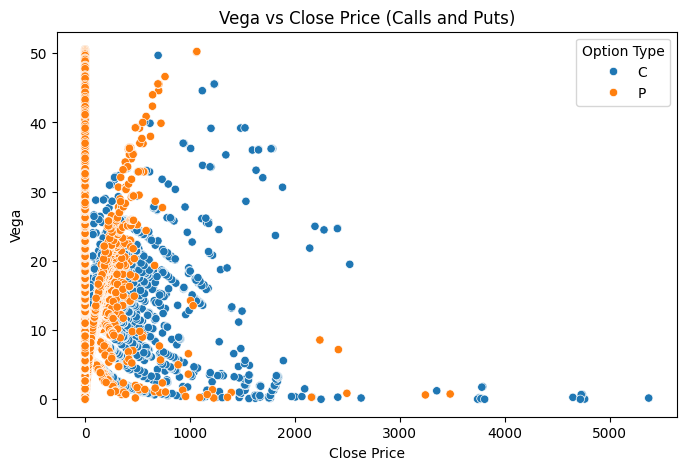

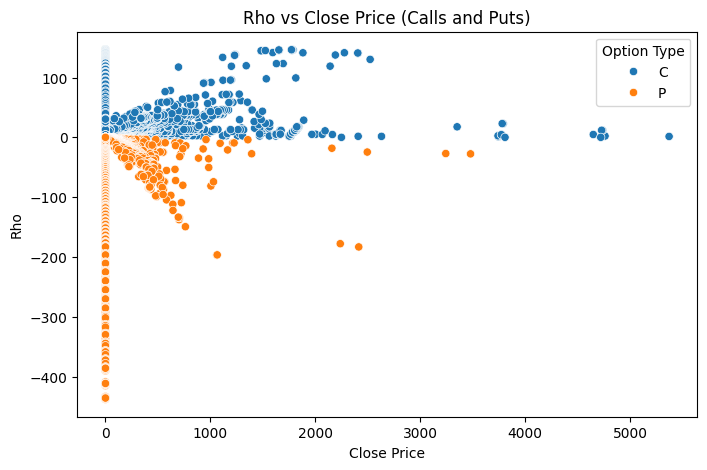

In [10]:
# Combine df_call and df_put into one dataframe
df_combined = pd.concat([df_call, df_put])

# Scatter plots of Greeks vs Strike and Implied Volatility for both calls and puts
for greek in greeks:
    plt.figure(figsize=(8, 5))
    
    # Plot combined data with hue for option_type
    sns.scatterplot(x='close', y=greek, hue='option_type', data=df_combined)
    
    plt.title(f'{greek.capitalize()} vs Close Price (Calls and Puts)')
    plt.xlabel('Close Price')
    plt.ylabel(greek.capitalize())
    plt.legend(title='Option Type')
    plt.show()